## SECTION 3-3

In [53]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures

In [54]:
perch_full = pd.read_csv('https://bit.ly/perch_csv_data')
perch_full.head()

,length,height,width
0,8.4,2.11,1.41
1,13.7,3.53,2.00
2,15.0,3.82,2.43
3,16.2,4.59,2.63
4,17.4,4.59,2.94


In [55]:
perch_length = np.array([8.4, 13.7, 15.0, 16.2, 17.4, 18.0, 18.7, 19.0, 19.6, 20.0, 21.0,
       21.0, 21.0, 21.3, 22.0, 22.0, 22.0, 22.0, 22.0, 22.5, 22.5, 22.7,
       23.0, 23.5, 24.0, 24.0, 24.6, 25.0, 25.6, 26.5, 27.3, 27.5, 27.5,
       27.5, 28.0, 28.7, 30.0, 32.8, 34.5, 35.0, 36.5, 36.0, 37.0, 37.0,
       39.0, 39.0, 39.0, 40.0, 40.0, 40.0, 40.0, 42.0, 43.0, 43.0, 43.5,
       44.0])
perch_weight = np.array([5.9, 32.0, 40.0, 51.5, 70.0, 100.0, 78.0, 80.0, 85.0, 85.0, 110.0,
       115.0, 125.0, 130.0, 120.0, 120.0, 130.0, 135.0, 110.0, 130.0,
       150.0, 145.0, 150.0, 170.0, 225.0, 145.0, 188.0, 180.0, 197.0,
       218.0, 300.0, 260.0, 265.0, 250.0, 250.0, 300.0, 320.0, 514.0,
       556.0, 840.0, 685.0, 700.0, 700.0, 690.0, 900.0, 650.0, 820.0,
       850.0, 900.0, 1015.0, 820.0, 1100.0, 1000.0, 1100.0, 1000.0,
       1000.0])

In [57]:
train_input, test_input, train_target, test_target = train_test_split(perch_full, perch_weight, random_state = 42)

In [58]:
poly = PolynomialFeatures()
poly.fit([[2, 3]])
print(poly.transform([[2, 3]]))

poly = PolynomialFeatures(include_bias = False)
poly.fit([[2, 3]])
print(poly.transform([[2, 3]]))

[[1. 2. 3. 4. 6. 9.]]
[[2. 3. 4. 6. 9.]]


In [ ]:
# train_input = train_input.reshape(-1, 1)
# test_input = test_input.reshape(-1, 1) # perch_full 없다고 생각해서 만든 것. 있다면 쓰지 말고, 없다면 reshape 해서 크기 맞춰서 쓰면 됨

poly = PolynomialFeatures(include_bias = False)
poly.fit(train_input)
train_poly = poly.transform(train_input)
print(train_poly.shape)

(42, 9)


In [61]:
poly.get_feature_names_out()
test_poly = poly.transform(test_input)
print(test_poly.shape)

(14, 9)


In [62]:
lr = LinearRegression()
lr.fit(train_poly, train_target)
print(lr.score(train_poly, train_target))
print(lr.score(test_poly, test_target))

0.9903183436982126
0.9714559911594125


In [63]:
poly = PolynomialFeatures(degree = 5, include_bias = False)
poly.fit(train_input)
train_poly = poly.transform(train_input)
test_poly = poly.transform(test_input)
print(train_poly.shape)

lr.fit(train_poly, train_target)
print(lr.score(train_poly, train_target))
print(lr.score(test_poly, test_target))

(42, 55)
0.9999999999997232
-144.40564483377855


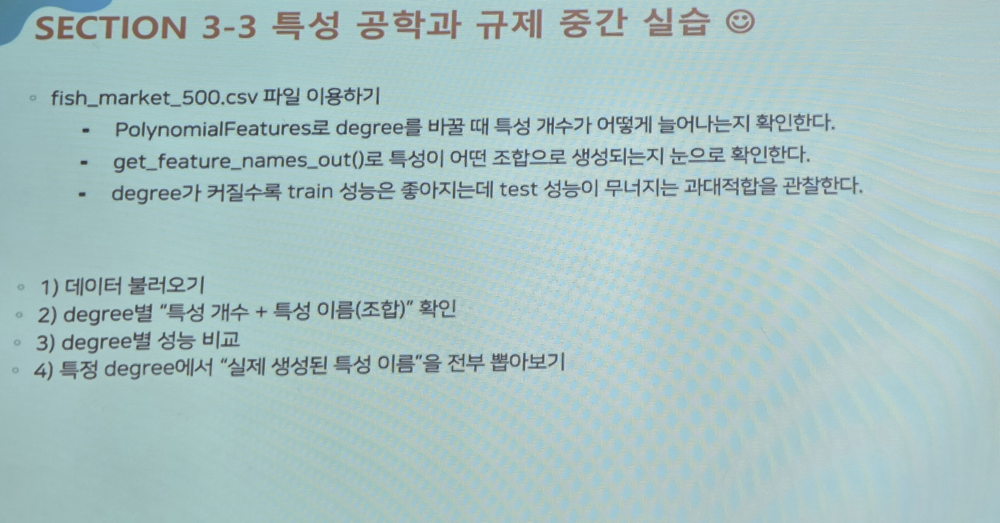

In [37]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import PolynomialFeatures, StandardScaler
from sklearn.linear_model import LinearRegression

In [36]:
df = pd.read_csv('../모두의 딥러닝/data/fish_market_500.csv')
df

,length,weight,height,width,species,price
0,11.50,36.3,3.31,1.00,smelt,1355
1,10.77,28.2,3.57,0.84,smelt,3215
2,33.47,950.2,12.63,4.69,bream,25225
3,34.62,753.6,13.55,4.82,bream,20833
4,14.27,22.6,3.43,1.42,smelt,2711
...,...,...,...,...,...,...
495,31.82,643.5,11.39,4.01,bream,19804
496,10.49,24.8,2.90,1.18,smelt,1206
497,33.75,1078.4,10.97,4.16,bream,27986
498,12.82,42.8,3.39,0.85,smelt,3855


In [41]:
print(f"삭제 전 데이터 개수: {len(df)}")
df = df.dropna() 
print(f"삭제 후 데이터 개수: {len(df)}")

삭제 전 데이터 개수: 500
삭제 후 데이터 개수: 428


In [42]:
X = df.drop(columns=['weight', 'species'])
y = df['weight']

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=248)

# 스케일링 (다항 회귀는 항이 커지면 수치가 폭발하므로 필수입니다)
ss = StandardScaler()
X_train_scaled = ss.fit_transform(X_train)
X_test_scaled = ss.transform(X_test)

# Degree 변화에 따른 실험
degrees = [1, 2, 5] # 1차(선형), 2차(곡선), 5차(복잡)

for d in degrees:
    print(f"\n--- [Degree: {d}] ---")
    
    poly = PolynomialFeatures(degree=d, include_bias=False)
    X_train_poly = poly.fit_transform(X_train_scaled)
    X_test_poly = poly.transform(X_test_scaled)
    
    print(f"생성된 특성 개수: {X_train_poly.shape[1]}개")
    print(f"특성 조합 예시: {poly.get_feature_names_out()[:5]} ...")
    
    lr = LinearRegression()
    lr.fit(X_train_poly, y_train)
    
    train_score = lr.score(X_train_poly, y_train)
    test_score = lr.score(X_test_poly, y_test)
    
    print(f"Train Score (R2): {train_score:.4f}")
    print(f"Test Score (R2): {test_score:.4f}")
    
    if train_score > test_score + 0.1:
        print("결과: ⚠️ 과대적합(Overfitting) 발생! 모델이 훈련 데이터에 너무 민감합니다.")
    elif train_score < 0.7:
        print("결과: ⚠️ 과소적합(Underfitting) 발생! 모델이 너무 단순합니다.")
    else:
        print("결과: ✅ 양호! 일반화 능력이 좋은 모델입니다.")


--- [Degree: 1] ---
생성된 특성 개수: 4개
특성 조합 예시: ['x0' 'x1' 'x2' 'x3'] ...
Train Score (R2): 0.1594
Test Score (R2): 0.1178
결과: ⚠️ 과소적합(Underfitting) 발생! 모델이 너무 단순합니다.

--- [Degree: 2] ---
생성된 특성 개수: 14개
특성 조합 예시: ['x0' 'x1' 'x2' 'x3' 'x0^2'] ...
Train Score (R2): 0.4297
Test Score (R2): 0.3599
결과: ⚠️ 과소적합(Underfitting) 발생! 모델이 너무 단순합니다.

--- [Degree: 5] ---
생성된 특성 개수: 125개
특성 조합 예시: ['x0' 'x1' 'x2' 'x3' 'x0^2'] ...
Train Score (R2): 0.8956
Test Score (R2): -2.4098
결과: ⚠️ 과대적합(Overfitting) 발생! 모델이 훈련 데이터에 너무 민감합니다.


--------------------

In [64]:
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import Ridge
import matplotlib.pyplot as plt

In [65]:
# 규제
ss = StandardScaler()
ss.fit(train_poly)
train_scaled = ss.transform(train_poly)
test_scaled = ss.transform(test_poly)

In [66]:
# 릿지 회귀
ridge = Ridge()
ridge.fit(train_scaled, train_target)
print(ridge.score(train_scaled, train_target))
print(ridge.score(test_scaled, test_target))

0.9896101671037343
0.9790693977615387


In [68]:
ridge = Ridge(alpha = 0.1)
ridge.fit(train_scaled, train_target)
print(ridge.score(train_scaled, train_target))
print(ridge.score(test_scaled, test_target))

0.9903815817570367
0.9827976465386928


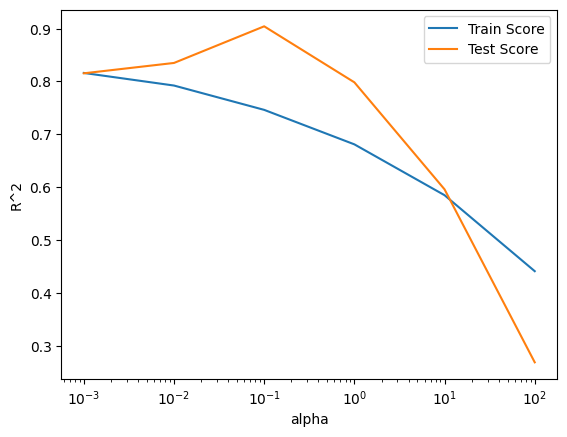

In [77]:
alpha_list = [0.001, 0.01, 0.1, 1, 10, 100]
train_score = []
test_score = []

for alpha in alpha_list:
    # 릿지 모델 생성 및 학습
    ridge = Ridge(alpha=alpha)
    ridge.fit(X_train_poly, y_train)
    
    # R^2 점수를 각각의 리스트에 추가 (이 부분이 있어야 그래프를 그릴 수 있음)
    train_score.append(ridge.score(X_train_poly, y_train))
    test_score.append(ridge.score(X_test_poly, y_test))

# 그래프 그리기 (교안의 시각화 방식 그대로)
plt.plot(alpha_list, train_score, label='Train Score')
plt.plot(alpha_list, test_score, label='Test Score')

plt.xscale('log')
plt.xlabel('alpha')
plt.ylabel('R^2')
plt.legend()
plt.show()

In [78]:
ridge = Ridge(alpha=0.1)
ridge.fit(train_scaled, train_target)
print(ridge.score(train_scaled,
train_target))
print(ridge.score(test_scaled, test_target))

0.9903815817570367
0.9827976465386928


In [84]:
from sklearn.linear_model import Lasso

In [ ]:
# 라쏘 회귀
lasso = Lasso()
lasso.fit(train_scaled, train_target)
print(lasso.score(train_scaled, train_target))
print(lasso.score(test_scaled, test_target)) 

0.989789897208096
0.9800593698421884


c:\Users\user\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:716: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.878e+04, tolerance: 5.183e+02
  model = cd_fast.enet_coordinate_descent(
c:\Users\user\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:716: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.297e+04, tolerance: 5.183e+02
  model = cd_fast.enet_coordinate_descent(


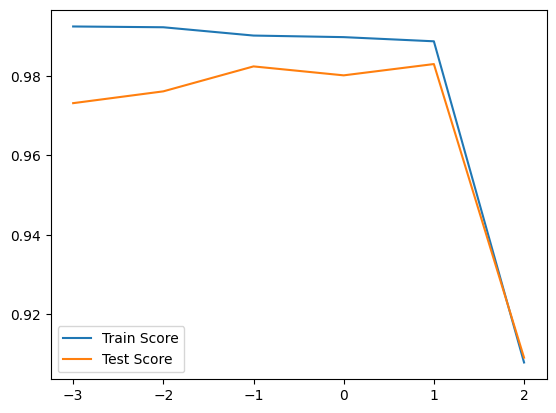

In [83]:
train_score = []
test_score = []
alpha_list = [0.001, 0.01, 0.1, 1, 10, 100]

for alpha in alpha_list:
    # 라쏘 모델을 만듭니다
    lasso = Lasso(alpha=alpha, max_iter=10000)
    # 라쏘 모델을 훈련합니다
    lasso.fit(train_scaled, train_target)
    # 훈련 점수와 테스트 점수를 저장합니다
    train_score.append(lasso.score(train_scaled, train_target))
    test_score.append(lasso.score(test_scaled, test_target))

plt.plot(np.log10(alpha_list), train_score, label='Train Score')
plt.plot(np.log10(alpha_list), test_score, label='Test Score')
plt.legend()
plt.show()

In [85]:
lasso = Lasso(alpha=10)
lasso.fit(train_scaled, train_target)
print(lasso.score(train_scaled, train_target))
print(lasso.score(test_scaled, test_target))

print(np.sum(lasso.coef_ == 0))

0.9888067471131866
0.9824470598706695
40


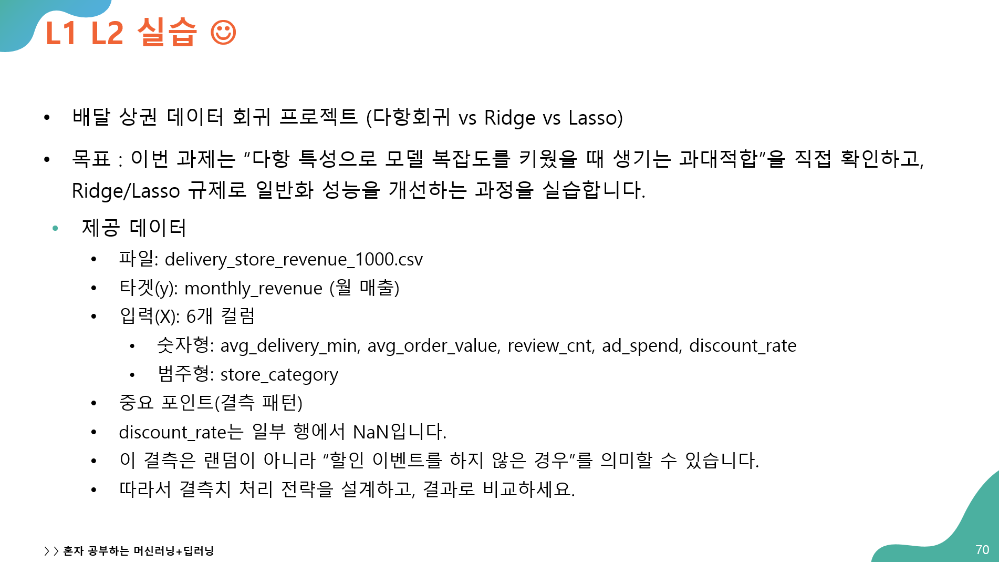
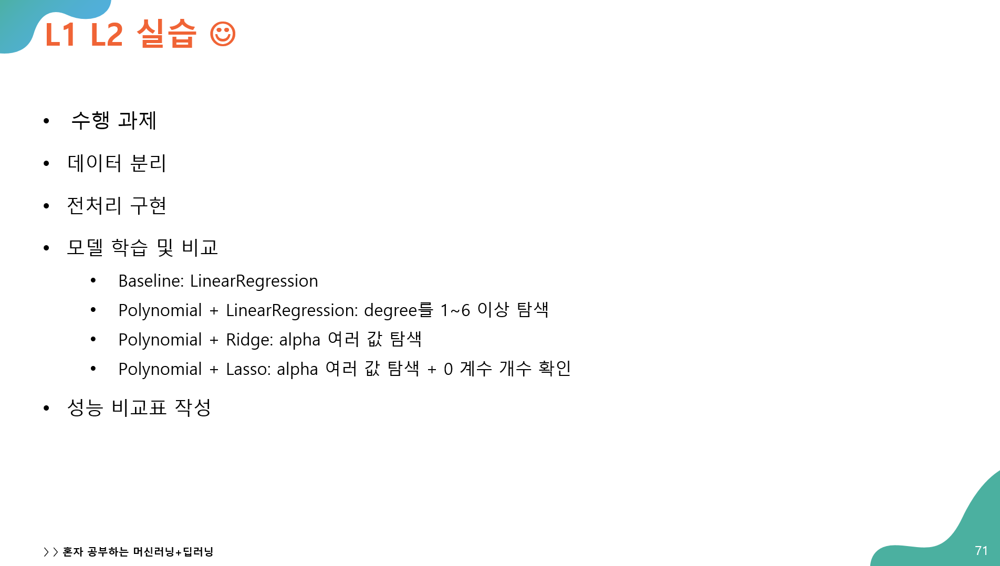

In [94]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import PolynomialFeatures, StandardScaler
from sklearn.linear_model import LinearRegression, Ridge, Lasso

In [87]:
df = pd.read_csv('delivery_store_revenue_1000.csv')
df

,avg_delivery_min,avg_order_value,review_cnt,ad_spend,store_category,discount_rate,monthly_revenue
0,27.6,24778,75,1604390,Pizza,15.2,5420362
1,44.2,20924,94,278974,Chicken,NaN,2656345
2,35.3,26991,85,155616,Pizza,17.5,3332158
3,32.2,8410,108,59546,Cafe,10.0,1638453
4,33.9,17233,63,111035,Korean,NaN,2218473
...,...,...,...,...,...,...,...
995,32.3,22761,100,116862,Chicken,6.6,3217402
996,32.6,7159,92,81433,Cafe,22.7,1234896
997,27.7,18071,78,320128,Korean,NaN,2617614
998,39.9,8000,88,415064,Dessert,9.5,1673575


In [92]:
df['store_category'].unique()

<StringArray>
['Pizza', 'Chicken', 'Cafe', 'Korean', 'Dessert']
Length: 5, dtype: str

In [95]:
# 범주형 변수 원-핫 인코딩
df_encoded = pd.get_dummies(df, columns=['store_category'])

# 결측치 처리 (할인율이 비어있으면 0(할인 없음)으로 간주)
df['discount_rate'] = df['discount_rate'].fillna(0)

# X, y 분리
X = df_encoded.drop('monthly_revenue', axis=1)
y = df_encoded['monthly_revenue']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=248)

print(f"인코딩 후 특성 개수: {X.shape[1]}개")

인코딩 후 특성 개수: 10개


In [ ]:
# 성능 결과 저장을 위한 리스트
performance = []

# --- [기본 모델: Baseline Linear Regression] ---
lr_base = LinearRegression()
lr_base.fit(X_train, y_train)
performance.append({
    'Model': 'Baseline (Linear)',
    'Train R2': lr_base.score(X_train, y_train),
    'Test R2': lr_base.score(X_test, y_test),
    'Zero Coef': 0
})

# --- [모델 1: Polynomial + Linear (Degree 탐색)] ---
# Degree 3 이상은 특성 폭발로 인해 성능이 급락할 수 있어 1~3 정도로 예시를 들고, 
# 5 이상 과대적합을 확인하기 위해 루프를 구성
best_poly_r2 = -np.inf
best_poly_degree = 1

for d in range(1, 11):
    poly = PolynomialFeatures(degree=d, include_bias=False)
    X_train_poly = poly.fit_transform(X_train)
    X_test_poly = poly.transform(X_test)
    
    lr_poly = LinearRegression()
    lr_poly.fit(X_train_poly, y_train)
    
    train_r2 = lr_poly.score(X_train_poly, y_train)
    test_r2 = lr_poly.score(X_test_poly, y_test)
    
    performance.append({
        'Model': f'Poly (Degree {d})',
        'Train R2': train_r2,
        'Test R2': test_r2,
        'Zero Coef': 0
    })

alphas = [0.1, 1, 10, 100]

# --- [모델 2 & 3: Poly (Deg 5) + Ridge & Lasso] ---
### 첫 과대적합이 발생한 Degree 5 데이터를 기준으로 규제 적용
poly_5 = PolynomialFeatures(degree=5, include_bias=False)
X_train_p5 = poly_5.fit_transform(X_train)
X_test_p5 = poly_5.transform(X_test)
# 스케일링 (규제 모델 필수)
ss = StandardScaler()
X_train_p5_scaled = ss.fit_transform(X_train_p5)
X_test_p5_scaled = ss.transform(X_test_p5)
# Ridge
for a in alphas:
    ridge = Ridge(alpha=a)
    ridge.fit(X_train_p5_scaled, y_train)
    performance.append({
        'Model': f'Ridge (Deg 5, a={a})',
        'Train R2': ridge.score(X_train_p5_scaled, y_train),
        'Test R2': ridge.score(X_test_p5_scaled, y_test),
        'Zero Coef': 0
    })
# Lasso
for a in alphas:
    # Lasso는 수렴 속도를 위해 max_iter를 넉넉히 줌
    lasso = Lasso(alpha=a, max_iter=10000)
    lasso.fit(X_train_p5_scaled, y_train)
    zero_count = np.sum(lasso.coef_ == 0) # 0이 된 계수 측정
    performance.append({
        'Model': f'Lasso (Deg 5, a={a})',
        'Train R2': lasso.score(X_train_p5_scaled, y_train),
        'Test R2': lasso.score(X_test_p5_scaled, y_test),
        'Zero Coef': zero_count
    })

# 성능 비교표 출력
perf_df = pd.DataFrame(performance)
print("\n=== 최종 모델 성능 비교표 ===")
print(perf_df.to_string(index=False, float_format=lambda x: f"{x:.4f}"))

c:\Users\user\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:716: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.052e+13, tolerance: 4.919e+10
  model = cd_fast.enet_coordinate_descent(
c:\Users\user\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:716: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.020e+13, tolerance: 4.919e+10
  model = cd_fast.enet_coordinate_descent(
c:\Users\user\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:716: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale 


=== 최종 모델 성능 비교표 ===
               Model  Train R2      Test R2  Zero Coef
   Baseline (Linear)    0.8471       0.8654          0
     Poly (Degree 1)    0.8471       0.8654          0
     Poly (Degree 2)    0.8639       0.8699          0
     Poly (Degree 3)    0.8695       0.8459          0
     Poly (Degree 4)    0.8568       0.1142          0
     Poly (Degree 5)    0.7692     -50.3104          0
     Poly (Degree 6)    0.5958    -783.9905          0
     Poly (Degree 7)    0.4033    -220.8662          0
     Poly (Degree 8)    0.2450   -4886.4662          0
     Poly (Degree 9)    0.1913   -2171.5173          0
    Poly (Degree 10)    0.1657 -211738.2034          0
Ridge (Deg 5, a=0.1)    0.9130     -47.7248          0
  Ridge (Deg 5, a=1)    0.8982     -13.8829          0
 Ridge (Deg 5, a=10)    0.8840       0.7926          0
Ridge (Deg 5, a=100)    0.8741       0.7037          0
Lasso (Deg 5, a=0.1)    0.9164     -52.4304       1701
  Lasso (Deg 5, a=1)    0.9163     -53.0262

c:\Users\user\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:716: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.541e+12, tolerance: 4.919e+10
  model = cd_fast.enet_coordinate_descent(


<Zero Coef 의미>
- Linear / Poly | 모든 특성을 복잡하게 다 사용 중 (과대적합 위험 높음)
- Ridge | 모든 특성을 사용하되, 힘(가중치)을 빼서 안정적으로 만듦
- Lasso | 중요한 특성만 골라내고 나머지는 제거함 (어떤 변수가 중요한지 알기 쉬움)